In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import shapefile as shp
import urllib, geojson, gdal, subprocess
import json
import requests
import folium
import datetime
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import OneHotEncoder
from bokeh.models import ColumnDataSource,FactorRange
from bokeh.plotting import figure
from bokeh.io import output_file, show
from bokeh.io import output_notebook
from bokeh.models import Legend
from bokeh.palettes import Spectral6
from bokeh.transform import factor_cmap
from bokeh.palettes import Category20_14 as palette
import itertools
from bokeh.models.tools import HoverTool

sns.set(style= 'whitegrid', palette='pastel', color_codes=True)
sns.mpl.rc('figure', figsize=(10,6))
# Set a plot style for nice plots.
plt.style.use('ggplot')

# Magic command useful jupyter notebook
%matplotlib inline

#Set plot size.
plt.rcParams['figure.figsize'] = [13,7]

#Set font size
plt.rcParams.update({'font.size':16})

Link to the website where the restaurant data was downloaded: [Data](https://data.cityofnewyork.us/Health/DOHMH-New-York-City-Restaurant-Inspection-Results/43nn-pn8j)

In [25]:
df = pd.read_csv('DOHMH_New_York_City_Restaurant_Inspection_Results.csv')

In [43]:
df.head()

,CAMIS,DBA,BORO,BUILDING,STREET,ZIPCODE,PHONE,CUISINE DESCRIPTION,INSPECTION DATE,ACTION,...,RECORD DATE,INSPECTION TYPE,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,BBL,NTA
0,40549885,MONTEZUMA RESTAURANT,Bronx,119,WEST KINGSBRIDGE ROAD,10468.0,7186016400,Mexican,03/18/2019,Violations were cited in the following area(s).,...,03/30/2020,Cycle Inspection / Re-inspection,40.868621,-73.902168,208.0,14.0,26701.0,2015261.0,2.032480e+09,BX28
1,40594703,RESTAURANT RIKI,Manhattan,141,EAST 45 STREET,10017.0,2129865604,Japanese,03/15/2017,Violations were cited in the following area(s).,...,03/30/2020,Cycle Inspection / Re-inspection,40.753164,-73.974161,106.0,4.0,9200.0,1036192.0,1.013000e+09,MN19
2,41644384,WASABI RESTAURANT,Brooklyn,7222,18 AVENUE,11204.0,7183313933,Japanese,06/25/2018,Establishment Closed by DOHMH. Violations wer...,...,03/30/2020,Cycle Inspection / Re-inspection,40.614953,-73.994406,311.0,43.0,26400.0,3158494.0,3.061930e+09,BK28
3,41529391,CHINA WOK,Brooklyn,5813,AVENUE T,11234.0,7182095999,Chinese,05/02/2017,Violations were cited in the following area(s).,...,03/30/2020,Cycle Inspection / Initial Inspection,40.615279,-73.918465,318.0,46.0,68800.0,3236237.0,3.083800e+09,BK58
4,50073113,EDDY'S FRESH BREAKFAST & LUNCH,Queens,7509,WOODHAVEN BLVD,11385.0,9176090337,American,03/16/2018,Violations were cited in the following area(s).,...,03/30/2020,Pre-permit (Operational) / Re-inspection,40.708623,-73.859395,406.0,29.0,63700.0,4095037.0,4.038860e+09,QN19


Here, we take the ID of the restaurant, the name, the location (lat,long, borough and street) and the cuisine description, and group by the restaurant, while taking the mean value of the score that the restaurant has been given.

In [59]:
df_restaurant = df.groupby(['CAMIS','DBA','Latitude','Longitude','BORO','STREET','CUISINE DESCRIPTION'], as_index=False)['SCORE'].mean()

The number of NaNs are counted, and then they are dropped.

In [62]:
df_restaurant.isna().sum()

CAMIS                    0
DBA                      0
Latitude                 0
Longitude                0
BORO                     0
STREET                   0
CUISINE DESCRIPTION      0
SCORE                  906
dtype: int64

In [63]:
df_restaurant.dropna()

,CAMIS,DBA,Latitude,Longitude,BORO,STREET,CUISINE DESCRIPTION,SCORE
0,30075445,MORRIS PARK BAKE SHOP,40.848231,-73.855972,Bronx,MORRIS PARK AVE,Bakery,10.600000
1,30112340,WENDY'S,40.662652,-73.962081,Brooklyn,FLATBUSH AVENUE,Hamburgers,19.809524
2,30191841,DJ REYNOLDS PUB AND RESTAURANT,40.767326,-73.984310,Manhattan,WEST 57 STREET,Irish,10.888889
3,40356018,RIVIERA CATERERS,40.579920,-73.982090,Brooklyn,STILLWELL AVENUE,American,11.125000
4,40356483,WILKEN'S FINE FOOD,40.620112,-73.906989,Brooklyn,AVENUE U,Delicatessen,13.000000
...,...,...,...,...,...,...,...,...
26779,50103853,D BUILDING CAFE,40.655755,-73.944580,Brooklyn,CLARKSON AVE,American,2.000000
26786,50103876,FONTANA PIZZERIA,40.712469,-73.895242,Queens,METROPOLITAN AVE,Pizza/Italian,25.000000
26803,50103991,LAZZARO,40.709494,-74.011813,Manhattan,TRINITY PL,Pizza,2.000000
26822,50104160,SUNDAY TO SUNDAY,40.717976,-73.990296,Manhattan,ORCHARD ST,Café/Coffee/Tea,2.000000


In [70]:
print(min(df_restaurant['SCORE']))
print(max(df_restaurant['SCORE']))

0.0
133.0


In [64]:
df_restaurant['CUISINE DESCRIPTION'].unique()

array(['Bakery', 'Hamburgers', 'Irish', 'American', 'Delicatessen',
       'Ice Cream, Gelato, Yogurt, Ices', 'Hotdogs', 'Jewish/Kosher',
       'Chinese', 'Sandwiches/Salads/Mixed Buffet', 'Caribbean', 'Donuts',
       'Bagels/Pretzels', 'Continental', 'Pizza', 'Soul Food',
       'Pizza/Italian', 'Steak', 'Italian', 'Polish',
       'Latin (Cuban, Dominican, Puerto Rican, South & Central American)',
       'German', 'French', 'Spanish', 'Café/Coffee/Tea', 'Seafood',
       'Tex-Mex',
       'Bottled beverages, including water, sodas, juices, etc.',
       'Mexican', 'Japanese', 'Greek', 'Thai', 'Indian', 'Mediterranean',
       'Russian', 'Eastern European', 'Chicken', 'Ethiopian', 'Barbecue',
       'Middle Eastern', 'Korean', 'Egyptian', 'English',
       'Pancakes/Waffles', 'Other', 'Chinese/Cuban', 'Asian',
       'Portuguese', 'Indonesian', 'Armenian', 'Turkish', 'Moroccan',
       'Hawaiian', 'Vegetarian', 'Filipino',
       'Juice, Smoothies, Fruit Salads', 'Brazilian',
      

In [66]:
focuscuisines = set(['Mexican', 'Japanese','Chinese','Soul Food','Cajun','French','Italian','Indian','Greek','Thai'])

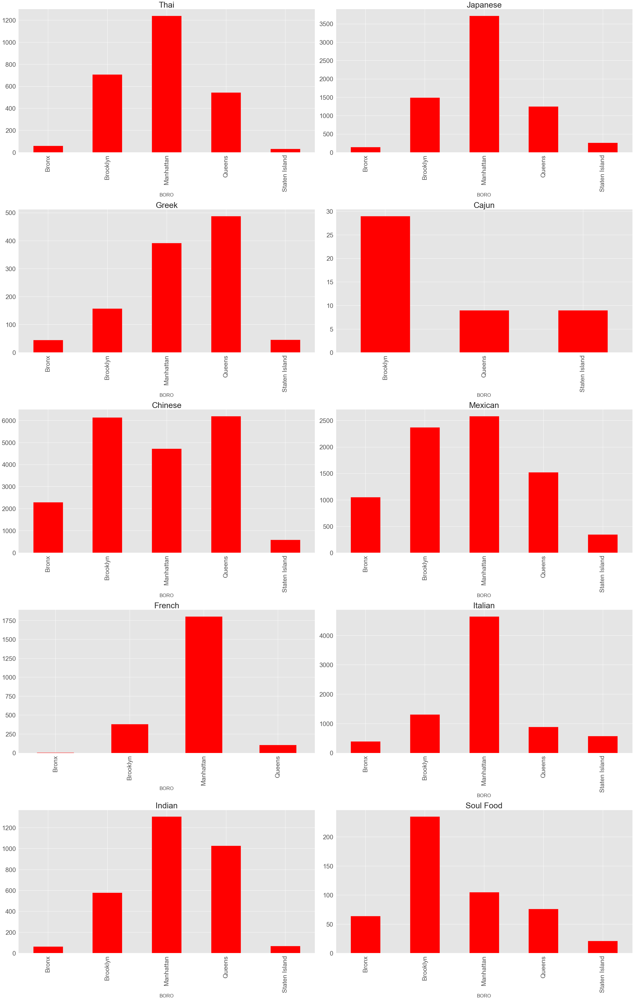

In [67]:
plt.figure(figsize=(35,55))
for i,elem in enumerate(focuscuisines):
    plt.subplot(5,2,i+1)
    dfPOW = df_clean[df_clean['CUISINE DESCRIPTION'] == elem]
    dfPOW.groupby(dfPOW['BORO']).size().plot(kind='bar', color = 'red')
    plt.xticks(fontsize=25)
    plt.yticks(fontsize=25)
    plt.title(elem,fontsize=32)
plt.tight_layout()    
plt.show()

In [68]:
from folium import plugins
from folium.plugins import HeatMap

map_NYC = folium.Map(location=[40.7128, -74.0060],zoom_start = 13) 

# Filter the DF for rows, then columns, then remove NaNs
df_map_NYC = df_clean[['Latitude', 'Longitude']]
df_map_NYC = df_map_NYC.dropna(axis=0, subset=['Latitude', 'Longitude'])

# List comprehension to make out list of lists
heat_data = [[row['Latitude'],row['Longitude']] for index, row in df_map_NYC.iterrows()]

# Plot it on the map
HeatMap(heat_data,radius=5).add_to(map_NYC)

# Display the map
map_NYC

Link to the website, where the taxi_trip data for 2015 January to June was downloaded [Data](https://data.cityofnewyork.us/Transportation/2015-Yellow-Taxi-Trip-Data/ba8s-jw6u).
Note that only 1% of the total data is imported, as there are 146million rows in the total dataset.

In [27]:
filename = "yellow_tripdata_2015-01-06.csv"
import random
p = 0.01  # 1% of the lines
# keep the header, then take only 1% of lines
# if random from [0,1] interval is greater than 0.01 the row will be skipped
df_taxi = pd.read_csv(
         filename,
         header=0, 
         skiprows=lambda i: i>0 and random.random() > p)

In [28]:
df_taxi.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,total_amount
0,2,2015-01-08 22:44:13,2015-01-08 23:24:44,1,23.34,-73.776688,40.645317,1,N,-73.908493,40.881989,2,63.0,0.5,0.5,0.00,5.33,69.63
1,2,2015-01-08 22:44:38,2015-01-08 22:53:43,4,1.44,-73.989792,40.734238,1,N,-73.974152,40.742947,1,8.5,0.5,0.5,1.80,0.00,11.60
2,2,2015-01-08 22:44:40,2015-01-08 22:51:50,1,1.54,-73.983017,40.761150,1,N,-74.003166,40.756351,1,7.0,0.5,0.5,1.50,0.00,9.80
3,2,2015-01-08 22:44:43,2015-01-08 22:54:54,1,2.13,-73.990967,40.750584,1,N,-73.983147,40.729874,1,9.5,0.5,0.5,3.00,0.00,13.80
4,1,2015-01-08 22:44:49,2015-01-08 23:27:15,1,28.50,-73.975182,40.751701,1,N,-74.210266,40.541569,1,76.0,0.5,0.5,26.62,11.75,115.67
